# PREDICTION AND ANALYSIS OF CLICK THROUGH RATE

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn import preprocessing
from sklearn.model_selection import KFold #Cross Validation
from sklearn.linear_model import LogisticRegression #Logistic Regression
from sklearn.model_selection import cross_val_score #Cross Validation Score
from sklearn import metrics
from sklearn.metrics import classification_report #Classification report using precision and recall
from sklearn.ensemble import RandomForestClassifier #Random Forest
from mlxtend.feature_selection import SequentialFeatureSelector #Feature Selection
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.model_selection import GridSearchCV #Parameter Tuning
from sklearn.naive_bayes import GaussianNB #Naive Bayes

import warnings
warnings.filterwarnings("ignore")

In [79]:
df=pd.read_csv('ad.csv')

In [80]:
df.head()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Gender,Country,Timestamp,Clicked on Ad
0,78.84,30.0,68448.94,161.79,Front-line even-keeled website,Silvaton,Male,Peru,2016-04-04 03:57:48,1
1,60.23,35.0,66815.54,216.24,Front-line fresh-thinking open system,West Jeremyside,Male,Papua New Guinea,2016-06-18 16:02:34,0
2,46.20,49.0,62109.80,135.24,Enhanced maximized access,Lake Vanessa,Male,Chile,2016-06-26 07:01:47,1
3,87.85,31.0,50055.33,134.46,Total zero administration software,Port Sherrystad,Male,French Polynesia,2016-04-18 21:07:28,1
4,64.38,37.0,55121.65,232.54,Devolved regional moderator,South Patrickfort,Female,Bosnia and Herzegovina,2016-07-18 18:33:05,0


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  50000 non-null  float64
 1   Age                       50000 non-null  float64
 2   Area Income               50000 non-null  float64
 3   Daily Internet Usage      50000 non-null  float64
 4   Ad Topic Line             50000 non-null  object 
 5   City                      50000 non-null  object 
 6   Gender                    50000 non-null  object 
 7   Country                   50000 non-null  object 
 8   Timestamp                 50000 non-null  object 
 9   Clicked on Ad             50000 non-null  int64  
dtypes: float64(4), int64(1), object(5)
memory usage: 3.8+ MB


In [82]:
df.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Clicked on Ad
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,64.133188,35.835400,53927.726446,174.776637,0.497640
std,14.842587,8.865057,11413.630035,42.023941,0.499999
min,32.600000,19.000000,13996.500000,104.780000,0.000000
25%,49.840000,29.000000,47575.440000,136.180000,0.000000
50%,66.630000,34.000000,55993.680000,167.860000,0.000000
75%,76.440000,41.000000,63100.130000,213.750000,1.000000
max,91.370000,60.000000,79332.330000,269.960000,1.000000


In [83]:
df.isnull().sum()
#Dataset has no missing or null values

Daily Time Spent on Site    0
Age                         0
Area Income                 0
Daily Internet Usage        0
Ad Topic Line               0
City                        0
Gender                      0
Country                     0
Timestamp                   0
Clicked on Ad               0
dtype: int64

In [84]:
#Datatypes of each column in the dataset
df.dtypes


Daily Time Spent on Site    float64
Age                         float64
Area Income                 float64
Daily Internet Usage        float64
Ad Topic Line                object
City                         object
Gender                       object
Country                      object
Timestamp                    object
Clicked on Ad                 int64
dtype: object

In [85]:
#Column names in the data
df.columns


Index(['Daily Time Spent on Site', 'Age', 'Area Income',
       'Daily Internet Usage', 'Ad Topic Line', 'City', 'Gender', 'Country',
       'Timestamp', 'Clicked on Ad'],
      dtype='object')

In [86]:
#Replacing spaces with underscore in column names
df.columns=df.columns.str.replace(' ','_')
df.columns


Index(['Daily_Time_Spent_on_Site', 'Age', 'Area_Income',
       'Daily_Internet_Usage', 'Ad_Topic_Line', 'City', 'Gender', 'Country',
       'Timestamp', 'Clicked_on_Ad'],
      dtype='object')

## Data Preprocessing and Analysis

In [87]:
#Timestamp column has both date and time in it. Thus, dividing the column into respective Date and Time columns. Additionally, removing seconds from the Time

df['date']=df['Timestamp'].apply(lambda x:x.split(' ')[0])
df['Time']=df['Timestamp'].apply(lambda x:x.split(' ')[1])
df['Time'] = df['Time'].astype(str).str[:-3]

In [88]:
#Dropping Timestamp column from the data
df.drop(['Timestamp'],axis=1,inplace=True)
df.head()

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,Clicked_on_Ad,date,Time
0,78.84,30.0,68448.94,161.79,Front-line even-keeled website,Silvaton,Male,Peru,1,2016-04-04,03:57
1,60.23,35.0,66815.54,216.24,Front-line fresh-thinking open system,West Jeremyside,Male,Papua New Guinea,0,2016-06-18,16:02
2,46.20,49.0,62109.80,135.24,Enhanced maximized access,Lake Vanessa,Male,Chile,1,2016-06-26,07:01
3,87.85,31.0,50055.33,134.46,Total zero administration software,Port Sherrystad,Male,French Polynesia,1,2016-04-18,21:07
4,64.38,37.0,55121.65,232.54,Devolved regional moderator,South Patrickfort,Female,Bosnia and Herzegovina,0,2016-07-18,18:33


  0%|                                                                                         | 0/1418 [00:00<…

DataPrep Report
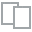
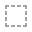
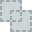
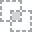
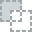
...
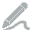
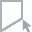
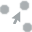
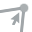
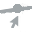

In [89]:
#Using automated exploratory data analysis tool (dataprep) for data insights
from dataprep.eda import create_report
create_report(df)


In [90]:
#The report created states there are 2237 duplicate rows
df[df.duplicated()]

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,Clicked_on_Ad,date,Time
303,79.54,31.0,33147.19,134.46,Polarized 5thgeneration matrix,Bakerhaven,Male,Cyprus,0,2016-03-06,06:51
441,66.18,31.0,50055.33,198.32,Polarized 5thgeneration matrix,Bakerhaven,Male,Niger,0,2016-03-06,06:51
1052,81.75,29.0,56909.30,193.29,Inverse local hub,Wagnerchester,Female,El Salvador,0,2016-02-15,16:18
1105,66.18,31.0,50055.33,198.32,Polarized 5thgeneration matrix,Bakerhaven,Male,Niger,0,2016-03-06,06:51
1276,85.84,32.0,52340.10,221.21,Advanced disintermediate data-warehouse,North Mercedes,Male,Australia,0,2016-03-18,16:04
...,...,...,...,...,...,...,...,...,...,...,...
49946,48.01,26.0,25686.34,248.23,Secured secondary superstructure,Davidton,Female,Tonga,0,2016-07-08,21:18
49954,71.89,32.0,52340.10,141.89,Innovative interactive portal,North Randy,Male,Australia,0,2016-03-18,16:04
49957,54.92,22.0,63102.19,169.40,Business-focused value-added definition,West Guybury,Male,Mayotte,0,2016-03-14,06:46
49962,85.84,32.0,52340.10,141.89,Innovative interactive portal,North Randy,Male,Australia,0,2016-03-18,16:04


In [91]:
#Removing duplicates from the data. Now the data has 47,763 rows
df.drop_duplicates(inplace=True)
len(df)

47763

In [92]:
#Number of users who clicked on Ad and who didn't 
df.groupby(['Clicked_on_Ad']).size().reset_index().rename(columns={0:'people_count'})

,Clicked_on_Ad,people_count
0,0,23469
1,1,24294


24,292 clicked and 23,469 didn't click

Dataset is balanced

In [93]:
#Checking for the number of users who viewed the advertisement at a particular time and displaying top 10 timings with maximum number of users
df0=df[df['Clicked_on_Ad']==1].groupby(['Time','Clicked_on_Ad']).size().reset_index().rename(columns={0:'people_count'}).sort_values(['people_count'])
df0=df0.tail(10).sort_values(['Time'])
df0

,Time,Clicked_on_Ad,people_count
21,01:09,1,553
140,07:01,1,629
143,07:07,1,475
213,10:07,1,333
299,14:35,1,560
387,18:50,1,788
422,20:34,1,2205
434,21:07,1,469
469,22:49,1,464
481,23:26,1,315


<AxesSubplot: xlabel='Time', ylabel='people_count'>

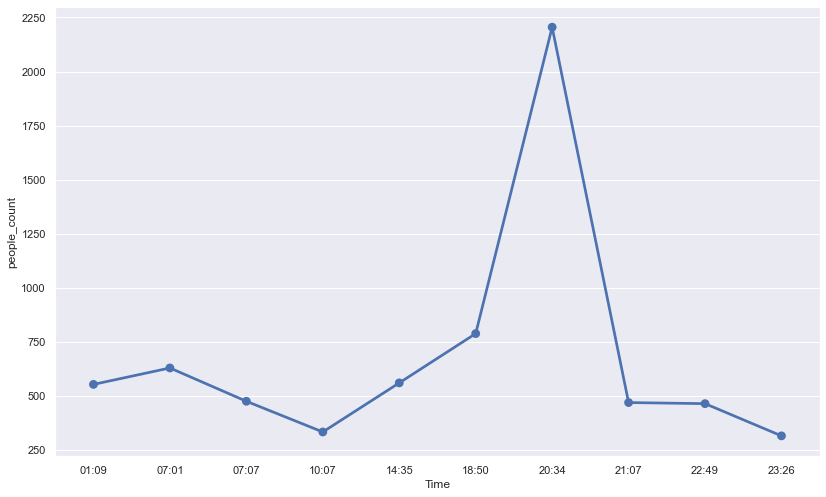

In [94]:
#Displaying the derived data using point plot from seaborn library
sns.set(rc={'figure.figsize':(13.7,8.27)})
sns.pointplot(data=df0,x='Time',y='people_count')

Number of users who clicked peaked at 8:34 pm and declined significantly after that. There are very less number of users clicked the Ad at 10:07 pm and 11:26 pm

In [95]:
#checking for number of people who clicked on ad based on age
df1=df[df['Clicked_on_Ad']==1].groupby(['Age','Clicked_on_Ad']).size().reset_index().rename(columns={0:'people_count'}).sort_values(['people_count'])
df1

,Age,Clicked_on_Ad,people_count
0,19.0,1,2
1,20.0,1,10
28,47.0,1,11
3,22.0,1,81
37,58.0,1,82
2,21.0,1,130
35,54.0,1,134
6,25.0,1,148
32,51.0,1,228
5,24.0,1,271


<AxesSubplot: xlabel='Age', ylabel='people_count'>

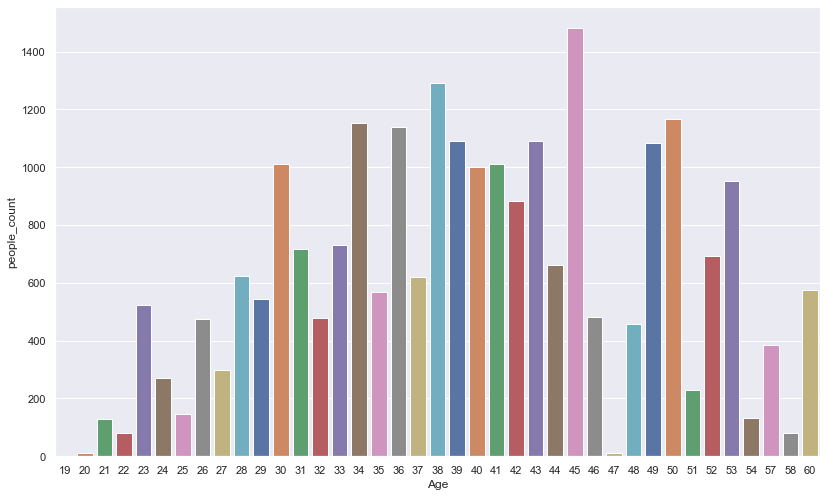

In [96]:
#Plotting the statistics that were obtained for better understanding

df1['Age']=df1['Age'].astype(int)
sns.set(rc={'figure.figsize':(13.7,8.27)})
sns.barplot(data=df1,x='Age',y='people_count',palette='deep')

It's interesting to note that, despite there being little variation in the age groups, those around 45 are the ones that clicked advertisements the most and people around 47 are the least.

In [97]:
#Number of people who clicked on ad with respect to Ad_Topic_Line

df2=df[df['Clicked_on_Ad']==1].groupby(['Ad_Topic_Line']).size().reset_index().rename(columns={0:'people_count'}).sort_values(['people_count'])
df2

,Ad_Topic_Line,people_count
393,Quality-focused maximized extranet,1
369,Profound executive flexibility,1
371,Profound stable product,1
373,Profound zero administration instruction set,1
374,Programmable didactic capacity,1
...,...,...
417,Realigned zero tolerance emulation,640
193,Future-proofed coherent budgetary management,658
186,Function-based fault-tolerant model,737
440,Seamless optimal contingency,1364


([<matplotlib.patches.Wedge at 0x1ccf2bced60>,
 [Text(1.0303758851890923, 0.38513054308999517, 'Realigned zero tolerance emulation'),
  Text(0.5153991243086362, 0.9717837941959575, 'Future-proofed coherent budgetary management'),
  Text(-0.31668310547740885, 1.0534285978200824, 'Function-based fault-tolerant model'),
  Text(-1.0939976279466492, 0.11475709148939311, 'Seamless optimal contingency'),
  Text(0.35531734907495544, -1.0410329396548155, 'Decentralized client-driven data-warehouse')],
 [Text(0.5620232101031412, 0.21007120532181553, '11%'),
  Text(0.28112679507743793, 0.5300638877432495, '12%'),
  Text(-0.1727362393513139, 0.5745974169927721, '13%'),
  Text(-0.5967259788799905, 0.06259477717603261, '24%'),
  Text(0.19380946313179384, -0.5678361489026266, '40%')])

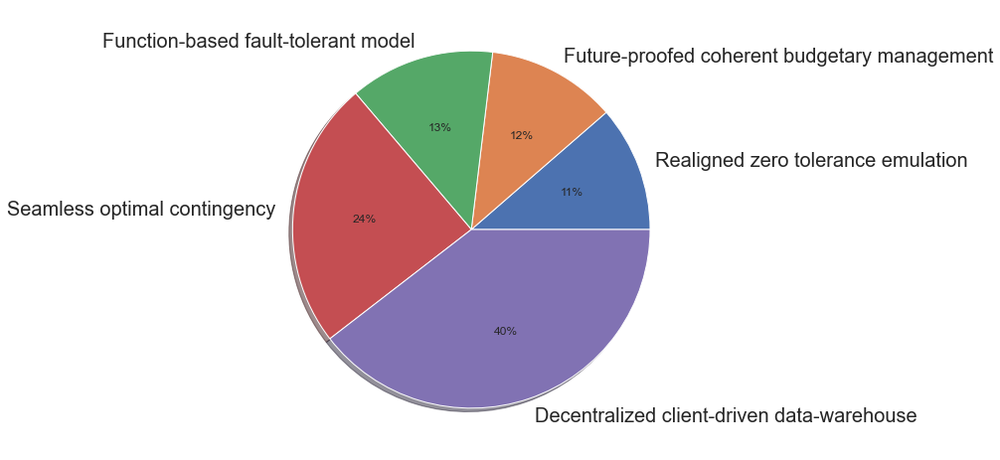

In [98]:
#displaying the top 5 ads and their ratio that have received the most user clicks (Ratio proportions in terms of top 5 only) using piechart

plt.rc('xtick', labelsize=20) 
top_five=df2.tail()
plt.pie(top_five['people_count'],labels=top_five['Ad_Topic_Line'],shadow=True,autopct='%.0f%%')

"Decentralized client-driven data-warehouse" holds 40% of user clicks followed by "Seamless optimal contigency" with 24%. Similar percentages of clicks appear to be present for three other ad topics.

<AxesSubplot: xlabel='Gender', ylabel='count'>

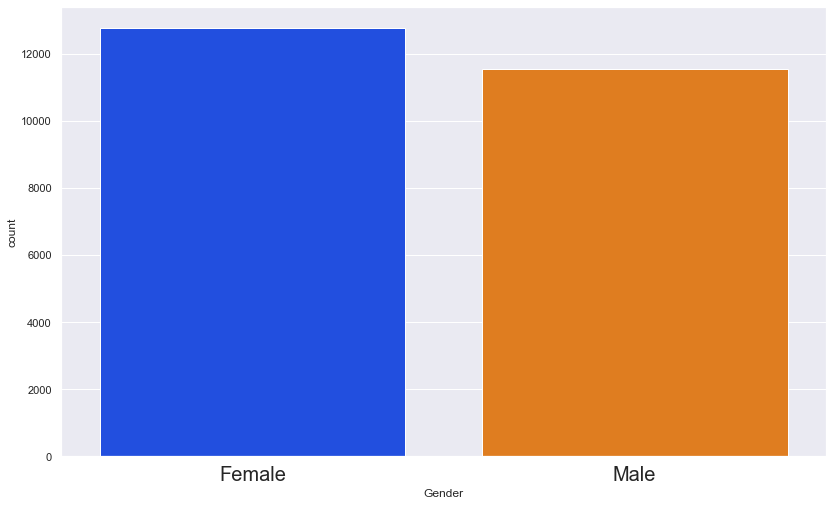

In [99]:
#counting the number of men and women that clicked on the advertisement using barplot

df3=df[df['Clicked_on_Ad']==1].groupby(['Gender']).size().reset_index().rename(columns={0:'count'})
sns.barplot(data=df3,x='Gender',y='count',palette='bright')

Over 12,000 females and around 11,500 males had clicked on Ad

<AxesSubplot: xlabel='City', ylabel='count'>

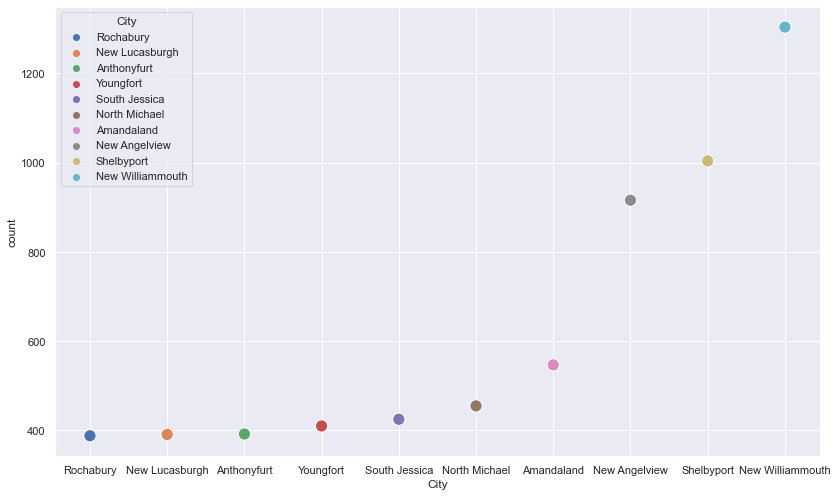

In [100]:
#Checking for the city that has most clicks and visualizing top 10 using scatterplot

df4=df[df['Clicked_on_Ad']==1]df2=df[df['Clicked_on_Ad']==1].groupby(['Ad_Topic_Line']).size().reset_index().rename(columns={0:'people_count'}).sort_values(['people_count']).rename(columns={0:'count'}).sort_values(['count'])
df4=df4.tail(10)
plt.rc('xtick', labelsize=11) 
sns.scatterplot(data=df4,x='City',y='count',s=150,hue='City',palette="deep")

New Williammouth has maximum clicks and Rochabury has least with over 1300 and around 350 respectively

In [101]:
#identifying the top 10 countries with the highest daily internet usage
df5=df.groupby(by='Country')['Daily_Internet_Usage'].sum().reset_index().rename(columns={0:'Daily_Internet_Usage'}).sort_values(['Daily_Internet_Usage'])
df5=df5.tail(10)
df5

,Country,Daily_Internet_Usage
125,Mayotte,151792.33
57,Eritrea,155600.16
174,Saudi Arabia,188705.99
47,Cuba,199018.74
31,Burkina Faso,199375.18
97,Jersey,212345.39
142,Niger,213951.82
55,El Salvador,224469.78
11,Australia,259131.61
153,Peru,425147.46


<AxesSubplot: xlabel='Country', ylabel='Daily_Internet_Usage'>

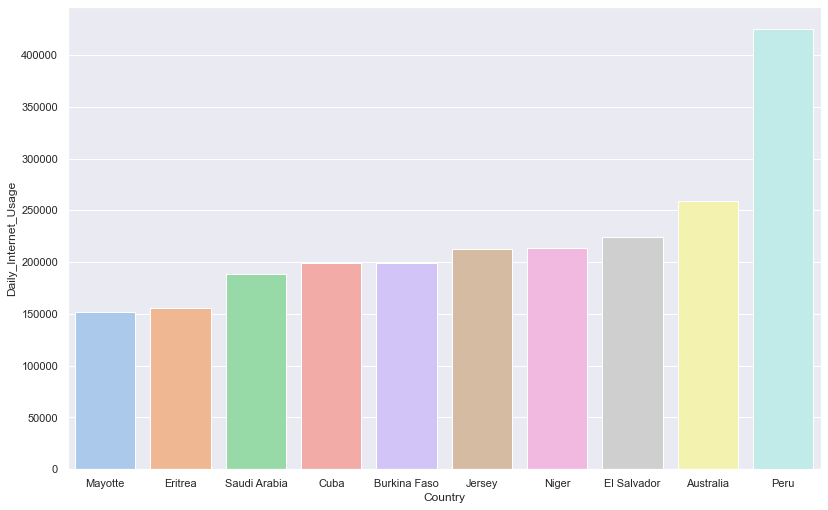

In [102]:
#plotting the data using barplots
sns.set(rc={'figure.figsize':(13.5,8.5)})
sns.barplot(data=df5,x='Country',y='Daily_Internet_Usage',palette='pastel')

Peru has the maximum daily internet usage followed by Australia and El Salvador

In [103]:
#Mapping age to respective age group and gender to 0's and 1's

df['Age']=pd.cut(df.Age,bins=['10','20','30','50','60'],labels=['Teen','Adult','Mid age adult','Elderly'])
df['Age']=df['Age'].astype(object)
df['Gender']=df['Gender'].map({'Male':0,'Female':1})

#Age group {10-20 as Teens, 20-30 as Adults, 30-50 as Mid Age Adults, 50-60 as elderly}
#Gender {Male as 0, Female as 1}

In [104]:
#Data set looks like this now
df.head()

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,Clicked_on_Ad,date,Time
0,78.84,Mid age adult,68448.94,161.79,Front-line even-keeled website,Silvaton,0,Peru,1,2016-04-04,03:57
1,60.23,Mid age adult,66815.54,216.24,Front-line fresh-thinking open system,West Jeremyside,0,Papua New Guinea,0,2016-06-18,16:02
2,46.20,Mid age adult,62109.80,135.24,Enhanced maximized access,Lake Vanessa,0,Chile,1,2016-06-26,07:01
3,87.85,Mid age adult,50055.33,134.46,Total zero administration software,Port Sherrystad,0,French Polynesia,1,2016-04-18,21:07
4,64.38,Mid age adult,55121.65,232.54,Devolved regional moderator,South Patrickfort,1,Bosnia and Herzegovina,0,2016-07-18,18:33


In [105]:
#Performing label encoding for all character based features 

label_encoder = preprocessing.LabelEncoder()

df['Ad_Topic_Line']= label_encoder.fit_transform(df['Ad_Topic_Line'])
df['City']= label_encoder.fit_transform(df['City'])
df['Country']= label_encoder.fit_transform(df['Country'])
df['date']= label_encoder.fit_transform(df['date'])
df['Time']= label_encoder.fit_transform(df['Time'])
df['Age']= label_encoder.fit_transform(df['Age'])

In [106]:
df.head()

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,Clicked_on_Ad,date,Time
0,78.84,2,68448.94,161.79,203,508,0,153,1,91,85
1,60.23,2,66815.54,216.24,205,594,0,151,0,165,376
2,46.20,2,62109.80,135.24,148,277,0,38,1,173,162
3,87.85,2,50055.33,134.46,606,461,0,66,1,104,504
4,64.38,2,55121.65,232.54,119,536,1,25,0,192,437


In [107]:
#Correlation between features
cormat = df.corr()
round(cormat,2)

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,Clicked_on_Ad,date,Time
Daily_Time_Spent_on_Site,1.00,0.03,-0.04,-0.03,0.01,0.02,-0.00,0.01,-0.04,0.00,-0.04
Age,0.03,1.00,-0.03,-0.20,0.04,-0.05,0.02,0.04,0.21,0.02,0.00
Area_Income,-0.04,-0.03,1.00,0.01,-0.02,-0.04,0.01,0.01,-0.04,0.04,0.02
Daily_Internet_Usage,-0.03,-0.20,0.01,1.00,-0.08,0.01,-0.02,0.03,-0.21,-0.00,0.05
Ad_Topic_Line,0.01,0.04,-0.02,-0.08,1.00,0.01,-0.03,0.02,0.03,0.00,-0.06
City,0.02,-0.05,-0.04,0.01,0.01,1.00,-0.05,-0.03,0.00,-0.03,0.00
Gender,-0.00,0.02,0.01,-0.02,-0.03,-0.05,1.00,0.03,-0.01,0.02,0.04
Country,0.01,0.04,0.01,0.03,0.02,-0.03,0.03,1.00,0.02,-0.01,0.02
Clicked_on_Ad,-0.04,0.21,-0.04,-0.21,0.03,0.00,-0.01,0.02,1.00,0.04,0.10
date,0.00,0.02,0.04,-0.00,0.00,-0.03,0.02,-0.01,0.04,1.00,0.07


<AxesSubplot: >

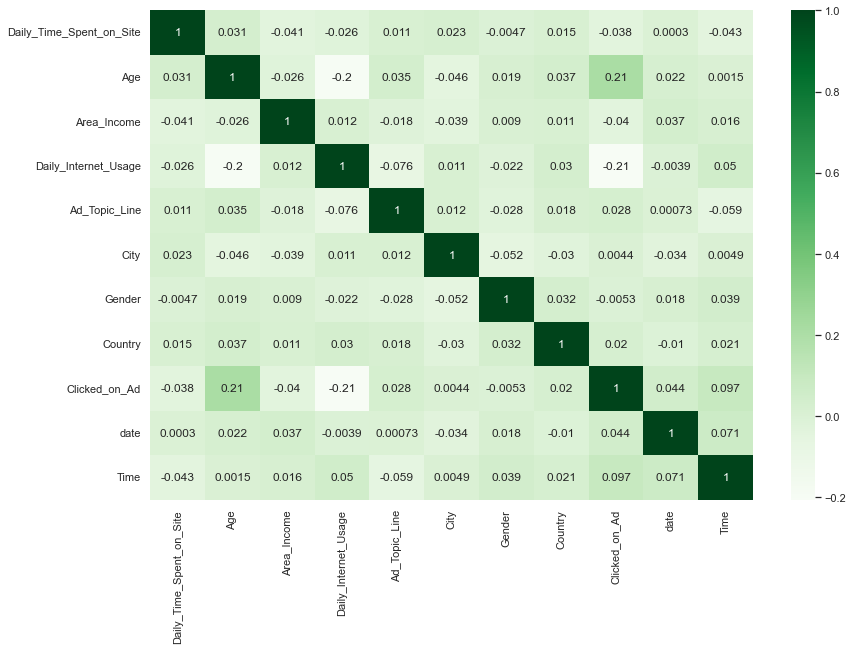

In [108]:
#Plotting the correlations
sns.set(rc={'figure.figsize':(13.5,9)})
sns.heatmap(cormat,annot=True,cmap='Greens')

Clicked on Ad is mostly correlated with Age and negatively correlated with Daily Internet Usage

In [109]:
#Preparing the data for classification
X = df.iloc[:, [0,1,2,3,4,5,6,7,9,10]]
y = df.iloc[:, -3]

In [110]:
#Independent features
X.head()

,Daily_Time_Spent_on_Site,Age,Area_Income,Daily_Internet_Usage,Ad_Topic_Line,City,Gender,Country,date,Time
0,78.84,2,68448.94,161.79,203,508,0,153,91,85
1,60.23,2,66815.54,216.24,205,594,0,151,165,376
2,46.20,2,62109.80,135.24,148,277,0,38,173,162
3,87.85,2,50055.33,134.46,606,461,0,66,104,504
4,64.38,2,55121.65,232.54,119,536,1,25,192,437


In [111]:
#Dependent feature
y.head()

0    1
1    0
2    1
3    1
4    0
Name: Clicked_on_Ad, dtype: int64

In [112]:
#Splitting the data (70% train and 30% test data)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30, random_state=50)

In [113]:
y_test

17021    0
31375    1
40577    1
11259    0
11001    0
        ..
47700    0
23898    0
18153    1
43400    0
4071     1
Name: Clicked_on_Ad, Length: 14329, dtype: int64

## Logistic Regression

In [146]:
#Implementing Logistic Regression 
model=LogisticRegression()
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
print("Accuracy",(model.score(X_test,y_test))*100)


Accuracy 55.17482029450764


In [147]:
y_pred

array([1, 1, 0, ..., 0, 0, 1], dtype=int64)

In [115]:
#printing confusion matrix
cnfusion_matrix = metrics.confusion_matrix(y_test, y_pred)
cnfusion_matrix

array([[4077, 2951],
       [2968, 4333]], dtype=int64)

In [116]:
#Implementing Logistic Regression using k-fold cross validation with k=10

kv=KFold(10)
res=cross_val_score(model,X,y,cv=kv)
print(res)

[0.58928198 0.58865397 0.5888633  0.58668342 0.59275544 0.58856784
 0.57705193 0.58731156 0.58919598 0.59359296]


In [117]:
#Accuracy of the model
print("Accuracy", (np.mean(res)*100))

Accuracy 58.81958375367172


No significant improvement in the accuracy in the model

Text(0.5, 574.24, 'Predicted')

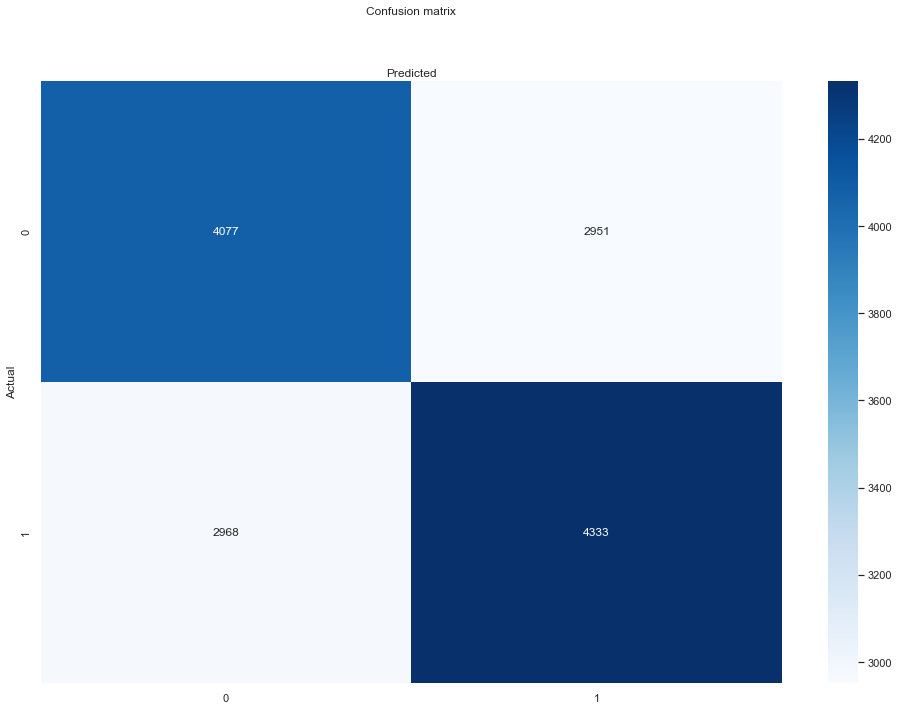

In [118]:
#Plotting confusion matrix of logistic regression model using a heatmap

class_names=[0,1] 
fig,ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.set(rc={'figure.figsize':(10,9)})
sns.heatmap(pd.DataFrame(cnfusion_matrix), annot=True, cmap="Blues" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [119]:
#Classification Report
target_names = ['Clicked on AD', 'Did not click on Ad']
print(classification_report(y_test, y_pred, target_names=target_names))

                     precision    recall  f1-score   support

      Clicked on AD       0.58      0.58      0.58      7028
Did not click on Ad       0.59      0.59      0.59      7301

           accuracy                           0.59     14329
          macro avg       0.59      0.59      0.59     14329
       weighted avg       0.59      0.59      0.59     14329



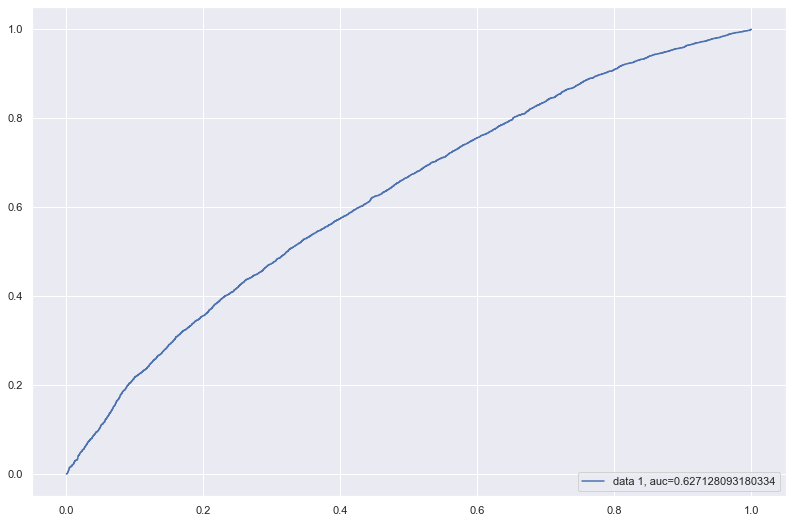

In [120]:
#ROC Curve
y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
sns.set(rc={'figure.figsize':(13.5,9)})
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

Area under the curve is 62%

##### 59% Accuracy

##  Forward feature selection using Random Forests

In [121]:
#forward feature selection
np.random.seed(9)
forward_feature_selection = SequentialFeatureSelector(RandomForestClassifier(n_jobs=-1),
                                                     k_features= (1,10),
                                                     forward=True,
                                                     floating=False,
                                                     verbose=2,
                                                     scoring= "accuracy",
                                                     cv= 5).fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   21.8s finished

[2022-12-06 21:47:45] Features: 1/10 -- score: 0.8415385512118043[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:   28.4s finished

[2022-12-06 21:48:13] Features: 2/10 -- score: 0.8684573015509397[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:   28.4s finished

[2022-12-06 21:48:42] Features: 3/10 -- score: 0.8716575810812618[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [122]:
#Significant features
forward_feature_selection.k_feature_names_


('Age', 'Area_Income', 'Ad_Topic_Line', 'City', 'Country', 'date', 'Time')

In [123]:
pd.DataFrame.from_dict(forward_feature_selection.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(5,)","[0.8428293704202183, 0.8410348437266337, 0.840...",0.841539,"(City,)",0.001201,0.000935,0.000467
2,"(5, 9)","[0.8703454463885151, 0.860924181247196, 0.8679...",0.868457,"(City, Time)",0.005298,0.004122,0.002061
3,"(5, 8, 9)","[0.8739344997756842, 0.8670554807836099, 0.871...",0.871658,"(City, date, Time)",0.003313,0.002578,0.001289
4,"(5, 7, 8, 9)","[0.8745326753402124, 0.8706445341707791, 0.874...",0.873901,"(City, Country, date, Time)",0.00317,0.002467,0.001233
5,"(4, 5, 7, 8, 9)","[0.876626289816061, 0.8743831314490803, 0.8785...",0.876473,"(Ad_Topic_Line, City, Country, date, Time)",0.002926,0.002277,0.001138
6,"(2, 4, 5, 7, 8, 9)","[0.8778226409451174, 0.8755794825781367, 0.878...",0.877939,"(Area_Income, Ad_Topic_Line, City, Country, da...",0.003224,0.002509,0.001254
7,"(1, 2, 4, 5, 7, 8, 9)","[0.8802153432032301, 0.8752803947958726, 0.884...",0.879225,"(Age, Area_Income, Ad_Topic_Line, City, Countr...",0.004928,0.003834,0.001917
8,"(1, 2, 3, 4, 5, 7, 8, 9)","[0.8805144309854942, 0.8761776581426649, 0.877...",0.878058,"(Age, Area_Income, Daily_Internet_Usage, Ad_To...",0.002475,0.001926,0.000963
9,"(1, 2, 3, 4, 5, 6, 7, 8, 9)","[0.882907133243607, 0.8736354119934201, 0.8820...",0.878477,"(Age, Area_Income, Daily_Internet_Usage, Ad_To...",0.004469,0.003477,0.001739
10,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)","[0.8769253775983251, 0.8739344997756842, 0.875...",0.876054,"(Daily_Time_Spent_on_Site, Age, Area_Income, D...",0.001462,0.001137,0.000569


In [124]:
#Random Forest Classifier
clf=RandomForestClassifier(n_estimators=100)
clf.fit(X_train,y_train)
y_pred=clf.predict(X_test)

In [125]:
#confusion matrix
con_matrix=metrics.confusion_matrix(y_test, y_pred)
con_matrix

array([[6146,  882],
       [ 850, 6451]], dtype=int64)

In [126]:
#Accuracy
print("Accuracy", (clf.score(X_test, y_test))*100)

Accuracy 87.91262474701654


<BarContainer object of 10 artists>

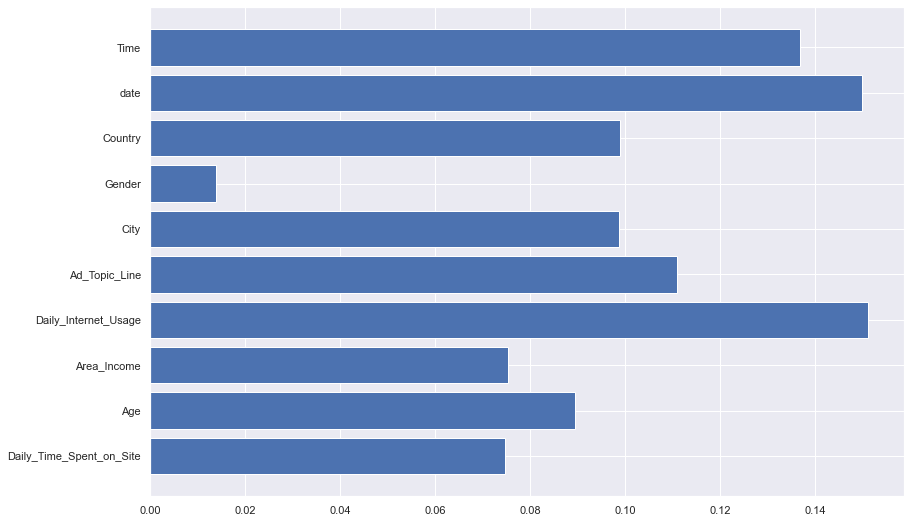

In [127]:
#Plotting the importance of features
sns.set(rc={'figure.figsize':(13.5,9)})
plt.barh(X.columns, clf.feature_importances_)

Gender, Area Income and Daily time spent on site are less significant features

In [128]:
#Classification Report
target_names = ['Clicked on AD', 'Did not click on Ad']
print(classification_report(y_test, y_pred, target_names=target_names))

                     precision    recall  f1-score   support

      Clicked on AD       0.88      0.87      0.88      7028
Did not click on Ad       0.88      0.88      0.88      7301

           accuracy                           0.88     14329
          macro avg       0.88      0.88      0.88     14329
       weighted avg       0.88      0.88      0.88     14329



##### Accuracy - 88%

## K Nearest Neighbors (using significant features only)

In [129]:
#Data splitting
X=df.iloc[:, [1,2,4,5,7,9,10]]
y = df.iloc[:, -3]

In [130]:
X.head()

,Age,Area_Income,Ad_Topic_Line,City,Country,date,Time
0,2,68448.94,203,508,153,91,85
1,2,66815.54,205,594,151,165,376
2,2,62109.80,148,277,38,173,162
3,2,50055.33,606,461,66,104,504
4,2,55121.65,119,536,25,192,437


In [131]:
y.head()

0    1
1    0
2    1
3    1
4    0
Name: Clicked_on_Ad, dtype: int64

In [132]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

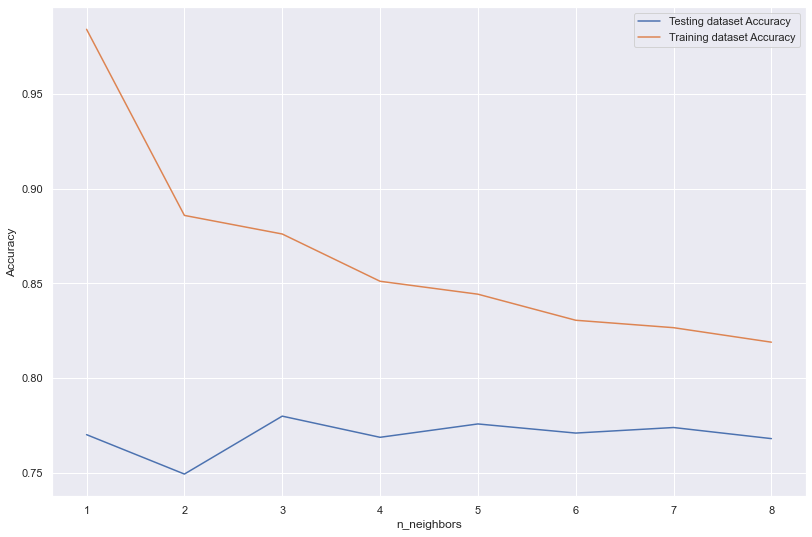

In [133]:
#Checking for best value of K using graph
neighbors = np.arange(1, 9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
  
# Loop over K values
for i, k in enumerate(neighbors):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    train_accuracy[i] = knn.score(X_train, y_train) #training accuracy
    test_accuracy[i] = knn.score(X_test, y_test) #test accuracy
sns.set(rc={'figure.figsize':(13.5,9)})
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

Test accuracy is high when k=3

In [134]:
#Also, parameter tuning to check for the best K value
parameters = {"n_neighbors": range(1, 50)}
gridsearch = GridSearchCV(KNeighborsClassifier(), parameters)
gridsearch.fit(X_train, y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 50)})

In [135]:
#finding best K value
gridsearch.best_params_

{'n_neighbors': 3}

In [136]:
#Implementing KNN
np.random.seed(1)
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [137]:
#predicting on test data
y_pred=knn.predict(X_test)

In [138]:
#Confusion Matrix
confusion_matrix=metrics.confusion_matrix(y_test, y_pred)
confusion_matrix

array([[5414, 1565],
       [1588, 5762]], dtype=int64)

Text(0.5, 574.24, 'Predicted')

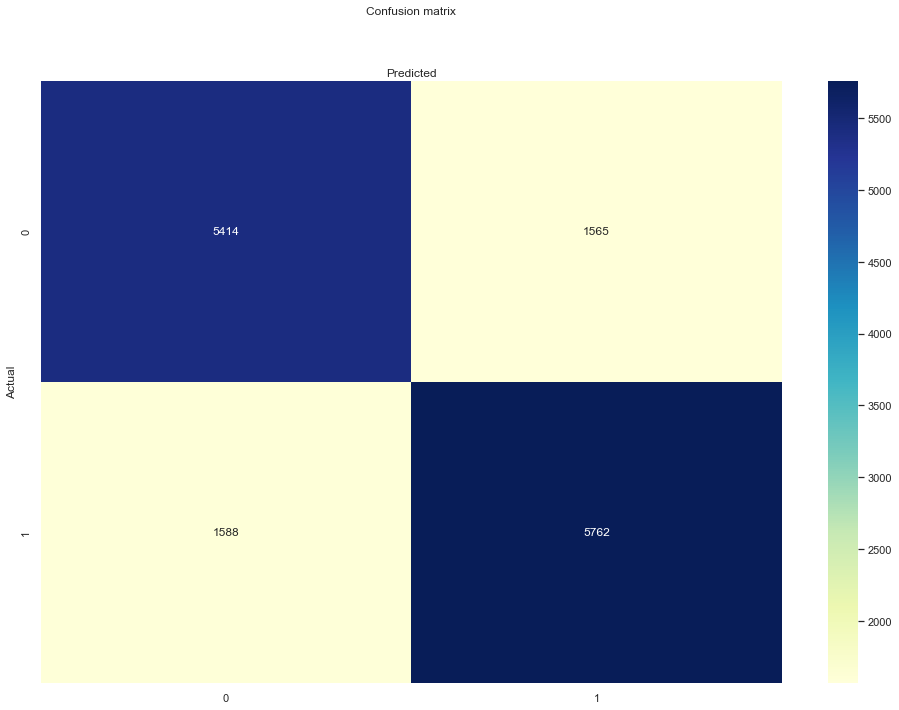

In [139]:
#plotting confusion matrix
class_names=[0,1] 
fig,ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.set(rc={'figure.figsize':(10,9)})
sns.heatmap(pd.DataFrame(confusion_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [140]:
#Accuracy
print("Accuracy",(knn.score(X_test, y_test))*100)

Accuracy 77.99567311047527


In [141]:
target_names = ['Clicked on AD', 'Did not click on Ad']
print(classification_report(y_test, y_pred, target_names=target_names))

                     precision    recall  f1-score   support

      Clicked on AD       0.77      0.78      0.77      6979
Did not click on Ad       0.79      0.78      0.79      7350

           accuracy                           0.78     14329
          macro avg       0.78      0.78      0.78     14329
       weighted avg       0.78      0.78      0.78     14329



##### 78% Accuracy

## Naive Bayes

In [142]:
#Implementing Naive Bayes
classifier = GaussianNB()
classifier.fit(X_train, y_train)

GaussianNB()

In [143]:
#Accuracy
y_pred = classifier.predict(X_test)
print("Accuracy",(classifier.score(X_test, y_test))*100)

Accuracy 61.94430874450415


In [144]:
#Confusion matrix
con_mat=metrics.confusion_matrix(y_test, y_pred)
con_mat

array([[3325, 3654],
       [1799, 5551]], dtype=int64)

In [145]:
target_names = ['Clicked on AD', 'Did not click on Ad']
print(classification_report(y_test, y_pred, target_names=target_names))

                     precision    recall  f1-score   support

      Clicked on AD       0.65      0.48      0.55      6979
Did not click on Ad       0.60      0.76      0.67      7350

           accuracy                           0.62     14329
          macro avg       0.63      0.62      0.61     14329
       weighted avg       0.63      0.62      0.61     14329



##### 62% Accuracy

### Accuracy Scores
Random Forest : 88%

KNN : 78%

Naive Bayes : 62%

Logistic Regression : 59%

Thus, Random Forest and KNN has given the best accuracy among all